In [1]:
!pip install torch torchvision transformers

In [2]:
!pip install gdown

In [3]:
 !gdown --id 1QBzgZ7hQtC80IqJcdMOPceddwK3JxP67
# uncomment if ur in colab

/usr/local/lib/python3.10/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1QBzgZ7hQtC80IqJcdMOPceddwK3JxP67
From (redirected): https://drive.google.com/uc?id=1QBzgZ7hQtC80IqJcdMOPceddwK3JxP67&confirm=t&uuid=1e3472a7-475b-4c79-b6e7-ff8c3024328f
To: /content/VQA.zip
100% 431M/431M [00:10<00:00, 39.4MB/s]


In [4]:
 !unzip /content/VQA.zip
# uncomment if ur in colab

Archive:  /content/VQA.zip
  inflating: dataset/all_qa_pairs.txt  
  inflating: dataset/answer_space.txt  
  inflating: dataset/data.csv        
  inflating: dataset/data_eval.csv   
  inflating: dataset/data_train.csv  
  inflating: dataset/images/image1.png  
  inflating: dataset/images/image10.png  
  inflating: dataset/images/image100.png  
  inflating: dataset/images/image1000.png  
  inflating: dataset/images/image1001.png  
  inflating: dataset/images/image1002.png  
  inflating: dataset/images/image1003.png  
  inflating: dataset/images/image1004.png  
  inflating: dataset/images/image1005.png  
  inflating: dataset/images/image1006.png  
  inflating: dataset/images/image1007.png  
  inflating: dataset/images/image1008.png  
  inflating: dataset/images/image1009.png  
  inflating: dataset/images/image101.png  
  inflating: dataset/images/image1010.png  
  inflating: dataset/images/image1011.png  
  inflating: dataset/images/image1012.png  
  inflating: dataset/images/image1013.

In [5]:
!pip install datasets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 11.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 12.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 17.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 13.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 15.0 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2024.10.0
    Uninstalling fsspec-2024.10.0:
      Successfully uninstalled fsspec-2024.10.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2024.10.0 requires fsspec==2024.10.0, but you have fsspec 2024.9.0 which is incompatible.


In [7]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [10]:
import pandas as pd
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
from PIL import Image
import os
from datasets import load_dataset
from transformers import BertTokenizer
class VQADataset(Dataset):
    def __init__(self, csv_file, image_folder, transform=None):
        # Load dataset from CSV
        self.data = pd.read_csv(csv_file)
        self.image_folder = image_folder
        self.transform = transform
        # Initialize the tokenizer
        self.tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
        # Preprocess the dataset
        self.preprocess_dataset()

    def preprocess_dataset(self):
        # Load the dataset using the provided logic
        dataset = load_dataset(
            "csv",
            data_files={
                "train": os.path.join("/content/dataset", "data_train.csv"),
                "test": os.path.join("/content/dataset", "data_eval.csv")
            }
        )

        with open(os.path.join("/content/dataset", "answer_space.txt")) as f:
            answer_space = f.read().splitlines()

        self.data = dataset.map(
            lambda examples: {
                'label': [
                    answer_space.index(ans.replace(" ", "").split(",")[0])  # Select the 1st answer if multiple answers are provided
                    for ans in examples['answer']
                ]
            },
            batched=True
        )

        # Convert dataset to DataFrame for easy indexing
        self.data = pd.DataFrame(self.data['train'])

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        row = self.data.iloc[idx]
        image_id = row['image_id']
        question = row['question']
        label = row['label']

        image_path = os.path.join(self.image_folder, f"{image_id}.png")
        image = Image.open(image_path).convert('RGB')
        if self.transform:
            image = self.transform(image)

        # Tokenize the question
        inputs = self.tokenizer(question, return_tensors='pt', padding='max_length', truncation=True, max_length=512)
        # Ensure the tensors are in the correct format for the DataLoader
        input_ids = inputs['input_ids'].squeeze(0)  # Remove batch dimension
        attention_mask = inputs['attention_mask'].squeeze(0)  # Remove batch dimension

        return image, input_ids, attention_mask, label



In [11]:
# Example usage:
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

train_dataset = VQADataset('/content/dataset/data_train.csv', '/content/dataset/images', transform)
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=4, pin_memory=True)
val_dataset = VQADataset('/content/dataset/data_eval.csv', '/content/dataset/images', transform)
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False, num_workers=4, pin_memory=True)


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating test split: 0 examples [00:00, ? examples/s]

Map:   0%|          | 0/9974 [00:00<?, ? examples/s]

Map:   0%|          | 0/2494 [00:00<?, ? examples/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [12]:
import torch
import torch.nn as nn
from transformers import BertModel
from torchvision import models
from torch.cuda.amp import autocast, GradScaler
from torch.utils.checkpoint import checkpoint
from tqdm import tqdm
import matplotlib.pyplot as plt
import json

class VQAModel(nn.Module):
    def __init__(self, num_answers):
        super(VQAModel, self).__init__()
        # Image feature extractor
        self.cnn = models.resnet50(pretrained=True)
        self.cnn.fc = nn.Identity()  # Remove the final classification layer

        # Question feature extractor
        self.bert = BertModel.from_pretrained('bert-base-uncased')

        # Fusion and final classification
        self.fc1 = nn.Linear(2048 + 768, 1024)
        self.fc2 = nn.Linear(1024, num_answers)
        self.dropout = nn.Dropout(0.5)

    def forward(self, images, input_ids, attention_mask):
        # Extract image features
        image_features = checkpoint(self.cnn, images)  # Use checkpointing for ResNet

        # Extract question features
        outputs = checkpoint(self.bert, input_ids, attention_mask)
        question_features = outputs.last_hidden_state[:, 0, :]  # shape: (batch_size, 768)

        # Concatenate features
        combined_features = torch.cat((image_features, question_features), dim=1)

        # Classification
        x = self.fc1(combined_features)
        x = self.dropout(x)
        x = self.fc2(x)
        return x


In [14]:
!wc -l /content/dataset/answer_space.txt

581 /content/dataset/answer_space.txt


# TRAINING #

In [21]:
import torch.optim as optim
from torch.nn import CrossEntropyLoss

# Initialize the model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = VQAModel(num_answers=582)
model.to(device)

# Initialize the optimizer and GradScaler for mixed precision training
optimizer = optim.Adam(model.parameters(), lr=0.001)
scaler = GradScaler()

# Define the loss function
criterion = nn.CrossEntropyLoss()

# Initialize metrics storage
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []

# Training parameters
num_epochs = 15
best_loss = float('inf')
best_model_state = None
patience = 4  # Number of epochs to wait for improvement before stopping
early_stopping_counter = 0


<ipython-input-21-8f3372833a8e>:11: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()


In [22]:
def calculate_accuracy(outputs, labels):
    _, preds = torch.max(outputs, 1)
    correct = (preds == labels).sum().item()
    total = labels.size(0)
    return correct / total

In [25]:
# Training loop
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    running_accuracy = 0.0
    progress_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}", unit="batch")

    for images, input_ids, attention_mask, labels in progress_bar:
        images = images.to(device)
        input_ids = input_ids.to(device)
        attention_mask = attention_mask.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        with torch.cuda.amp.autocast():
            outputs = model(images, input_ids, attention_mask)
            loss = criterion(outputs, labels)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item()
        accuracy = calculate_accuracy(outputs, labels)
        running_accuracy += accuracy

    epoch_loss = running_loss / len(train_loader)
    epoch_accuracy = running_accuracy / len(train_loader)

    train_losses.append(epoch_loss)
    train_accuracies.append(epoch_accuracy)

    model.eval()
    val_running_loss = 0.0
    val_running_accuracy = 0.0

    with torch.no_grad():
        val_progress_bar = tqdm(val_loader, desc="Validating", unit="batch")
        for images, input_ids, attention_mask, labels in val_progress_bar:
            images = images.to(device)
            input_ids = input_ids.to(device)
            attention_mask = attention_mask.to(device)
            labels = labels.to(device)

            with torch.cuda.amp.autocast():
                outputs = model(images, input_ids, attention_mask)
                loss = criterion(outputs, labels)

            val_running_loss += loss.item()
            accuracy = calculate_accuracy(outputs, labels)
            val_running_accuracy += accuracy

    val_loss = val_running_loss / len(val_loader)
    val_accuracy = val_running_accuracy / len(val_loader)

    val_losses.append(val_loss)
    val_accuracies.append(val_accuracy)

    print(f"Epoch {epoch+1}/{num_epochs}, Training Loss: {epoch_loss}, Training Accuracy: {epoch_accuracy}")
    print(f"Validation Loss: {val_loss}, Validation Accuracy: {val_accuracy}")

    # Check if the validation loss improved
    if val_loss < best_loss:
        best_loss = val_loss
        best_model_state = model.state_dict()
        early_stopping_counter = 0  # Reset counter if we get a new best loss
        print(f"Saving model with lowest validation loss: {best_loss:.4f}")
        torch.save({
            'epoch': epoch + 1,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'scaler_state_dict': scaler.state_dict(),
            'best_loss': best_loss,
            'train_losses': train_losses,
            'val_losses': val_losses,
            'train_accuracies': train_accuracies,
            'val_accuracies': val_accuracies
        }, "/content/drive/MyDrive/Colab Notebooks/best_model.pth")
    else:
        early_stopping_counter += 1
        print(f"No improvement in validation loss for {early_stopping_counter} epochs.")

    # Check for early stopping
    if early_stopping_counter >= patience:
        print("Early stopping triggered.")
        break

# Save the final metrics
metrics = {
    "train_losses": train_losses,
    "val_losses": val_losses,
    "train_accuracies": train_accuracies,
    "val_accuracies": val_accuracies
}

with open("/content/drive/MyDrive/Colab Notebooks/training_metrics.json", "w") as f:
    json.dump(metrics, f)

Epoch 1/15:   0%|          | 0/156 [00:00<?, ?batch/s]<ipython-input-25-93aa186a9882>:16: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Validating:   0%|          | 0/156 [00:00<?, ?batch/s]<ipython-input-25-93aa186a9882>:46: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Validating: 100%|██████████| 156/156 [02:23<00:00,  1.09batch/s]


Epoch 1/15, Training Loss: 4.228311867285997, Training Accuracy: 0.16272702991452992
Validation Loss: 3.2285957550391173, Validation Accuracy: 0.26366260090218424
Saving model with lowest validation loss: 3.2286


Validating: 100%|██████████| 156/156 [02:24<00:00,  1.08batch/s]


Epoch 2/15, Training Loss: 3.8624874567374206, Training Accuracy: 0.1942775106837607
Validation Loss: 3.03466511842532, Validation Accuracy: 0.2632359924026591
Saving model with lowest validation loss: 3.0347


Validating: 100%|██████████| 156/156 [02:24<00:00,  1.08batch/s]


Epoch 3/15, Training Loss: 3.683911305207473, Training Accuracy: 0.2147287511870845
Validation Loss: 2.589393416276345, Validation Accuracy: 0.32937143874643876
Saving model with lowest validation loss: 2.5894


Validating: 100%|██████████| 156/156 [02:23<00:00,  1.09batch/s]


Epoch 4/15, Training Loss: 3.5844066127752647, Training Accuracy: 0.2225412511870845
Validation Loss: 2.478066785213275, Validation Accuracy: 0.35507552825261157
Saving model with lowest validation loss: 2.4781


Validating: 100%|██████████| 156/156 [02:19<00:00,  1.12batch/s]


Epoch 5/15, Training Loss: 3.557452463186704, Training Accuracy: 0.232894853988604
Validation Loss: 2.3008429217032895, Validation Accuracy: 0.38632552825261157
Saving model with lowest validation loss: 2.3008


Validating: 100%|██████████| 156/156 [02:21<00:00,  1.10batch/s]


Epoch 6/15, Training Loss: 3.4543506105740867, Training Accuracy: 0.2407889660493827
Validation Loss: 2.336411940745818, Validation Accuracy: 0.3723735754985755
No improvement in validation loss for 1 epochs.


Validating: 100%|██████████| 156/156 [02:23<00:00,  1.08batch/s]


Epoch 7/15, Training Loss: 3.484119271620726, Training Accuracy: 0.24984790479582145
Validation Loss: 2.234927026125101, Validation Accuracy: 0.40511856006647673
Saving model with lowest validation loss: 2.2349


Validating: 100%|██████████| 156/156 [02:20<00:00,  1.11batch/s]


Epoch 8/15, Training Loss: 3.4614957586312904, Training Accuracy: 0.25357238247863245
Validation Loss: 2.235578798330747, Validation Accuracy: 0.40579371438746437
No improvement in validation loss for 1 epochs.


Validating: 100%|██████████| 156/156 [02:26<00:00,  1.07batch/s]


Epoch 9/15, Training Loss: 3.4368733763694763, Training Accuracy: 0.26412630579297247
Validation Loss: 2.13011111280857, Validation Accuracy: 0.4352408297720798
Saving model with lowest validation loss: 2.1301


Validating: 100%|██████████| 156/156 [02:25<00:00,  1.07batch/s]


Epoch 10/15, Training Loss: 3.451253360662705, Training Accuracy: 0.27109300807217473
Validation Loss: 2.19480768763102, Validation Accuracy: 0.4283483202754036
No improvement in validation loss for 1 epochs.


Validating: 100%|██████████| 156/156 [02:24<00:00,  1.08batch/s]


Epoch 11/15, Training Loss: 3.467472527271662, Training Accuracy: 0.275099418328585
Validation Loss: 2.2418798231161556, Validation Accuracy: 0.43203570156695154
No improvement in validation loss for 2 epochs.


Validating: 100%|██████████| 156/156 [02:22<00:00,  1.09batch/s]


Epoch 12/15, Training Loss: 3.3685762546001334, Training Accuracy: 0.291889245014245
Validation Loss: 2.057285237006652, Validation Accuracy: 0.45220500949667614
Saving model with lowest validation loss: 2.0573


Validating: 100%|██████████| 156/156 [02:21<00:00,  1.10batch/s]


Epoch 13/15, Training Loss: 3.4542489984096627, Training Accuracy: 0.2856347934472935
Validation Loss: 2.140662112297156, Validation Accuracy: 0.4391582086894587
No improvement in validation loss for 1 epochs.


Validating: 100%|██████████| 156/156 [02:20<00:00,  1.11batch/s]


Epoch 14/15, Training Loss: 3.411922179735624, Training Accuracy: 0.2943116393637227
Validation Loss: 2.032555648149588, Validation Accuracy: 0.4586709104938272
Saving model with lowest validation loss: 2.0326


Validating: 100%|██████████| 156/156 [02:25<00:00,  1.07batch/s]

Epoch 15/15, Training Loss: 3.4070581136605678, Training Accuracy: 0.295031309354226
Validation Loss: 2.0643936708951607, Validation Accuracy: 0.46732920821462487
No improvement in validation loss for 1 epochs.


# PLOTTING #

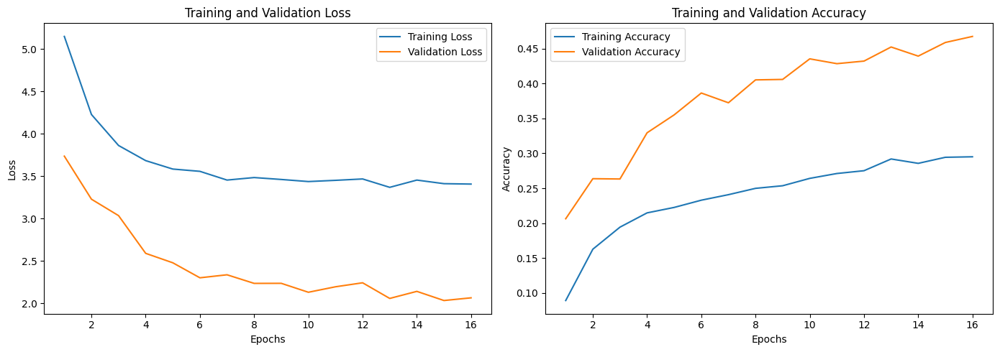

In [26]:
# Load the saved metrics
with open("/content/drive/MyDrive/Colab Notebooks/training_metrics.json", "r") as f:
    metrics = json.load(f)

train_losses = metrics["train_losses"]
val_losses = metrics["val_losses"]
train_accuracies = metrics["train_accuracies"]
val_accuracies = metrics["val_accuracies"]

# Plot the metrics
epochs = range(1, len(train_losses) + 1)

plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.plot(epochs, train_losses, label='Training Loss')
plt.plot(epochs, val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')

plt.subplot(1, 2, 2)
plt.plot(epochs, train_accuracies, label='Training Accuracy')
plt.plot(epochs, val_accuracies, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.tight_layout()
plt.show()


# TESTING #

In [ ]:
class VQAModel1(nn.Module):
    def __init__(self, num_answers):
        super(VQAModel1, self).__init__()
        # Image feature extractor
        self.cnn = models.resnet50(pretrained=True)
        self.cnn.fc = nn.Identity()  # Remove the final classification layer

        # Question feature extractor
        self.bert = BertModel.from_pretrained('bert-base-uncased')

        # Fusion and final classification
        self.fc1 = nn.Linear(2048 + 768, 1024)
        self.fc2 = nn.Linear(1024, num_answers)
        self.dropout = nn.Dropout(0.5)

    def forward(self, images, input_ids, attention_mask):
        # Extract image features
        image_features = self.cnn(images)

        # Extract question features
        outputs = self.bert(input_ids, attention_mask)
        question_features = outputs.last_hidden_state[:, 0, :]  # shape: (batch_size, 768)

        # Concatenate features
        combined_features = torch.cat((image_features, question_features), dim=1)

        # Classification
        x = self.fc1(combined_features)
        x = self.dropout(x)
        x = self.fc2(x)
        return x

In [28]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = VQAModel1(num_answers=582)  # Adjust num_answers based on your dataset
model.to(device)
# Load the best model checkpoint
checkpoint_path = "/content/drive/MyDrive/Colab Notebooks/best_model.pth"
checkpoint = torch.load(checkpoint_path)
model.load_state_dict(checkpoint['model_state_dict'])

print("Best model loaded successfully.")

<ipython-input-28-232b2c0d73ef>:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path)


Best model loaded successfully.


In [29]:
from torch.utils.data import DataLoader
from torchvision import transforms

# Example usage
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

test_dataset = VQADataset('/content/dataset/data_eval.csv', '/content/dataset/images', transform)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

print("Test data loader prepared successfully.")

Test data loader prepared successfully.


In [30]:
!pip install sentence-transformers

In [31]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from sentence_transformers import SentenceTransformer, util

# Load Sentence-BERT model
model_sbert = SentenceTransformer('paraphrase-MiniLM-L6-v2')

# Function to calculate similarity using Sentence-BERT
def sbert_similarity(sentence1, sentence2):
    embeddings1 = model_sbert.encode(sentence1, convert_to_tensor=True)
    embeddings2 = model_sbert.encode(sentence2, convert_to_tensor=True)
    cosine_scores = util.pytorch_cos_sim(embeddings1, embeddings2)
    return cosine_scores.item()

modules.json:   0%|          | 0.00/229 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/3.73k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/629 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/314 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

In [32]:
def preprocess_answer(answer):
    # Remove underscores from the answer
    return answer.replace('_', ' ')

In [33]:
# Load answer space for mapping
with open(os.path.join("/content/dataset/", "answer_space.txt")) as f:
    answer_space = f.read().splitlines()

model.eval()
test_losses = []
test_accuracies = []
similarities = []

criterion = nn.CrossEntropyLoss()

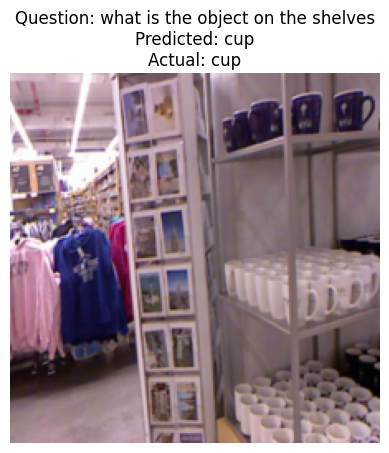

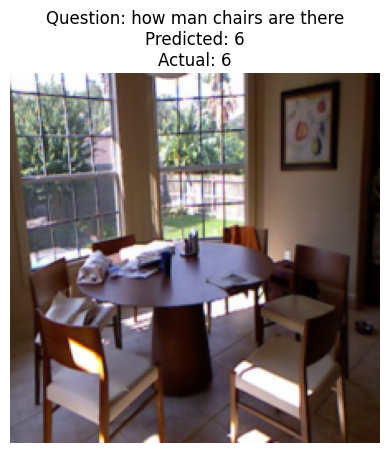

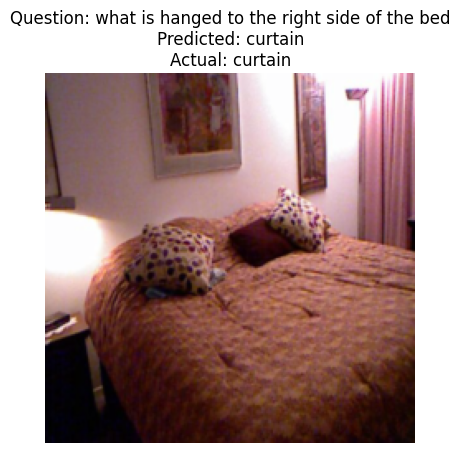

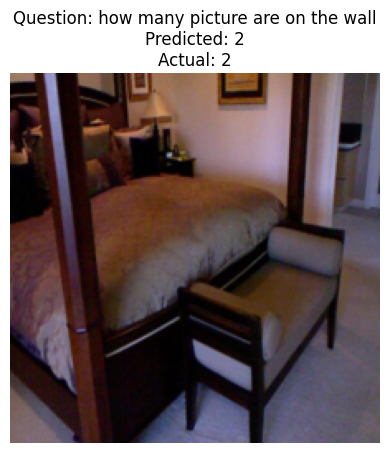

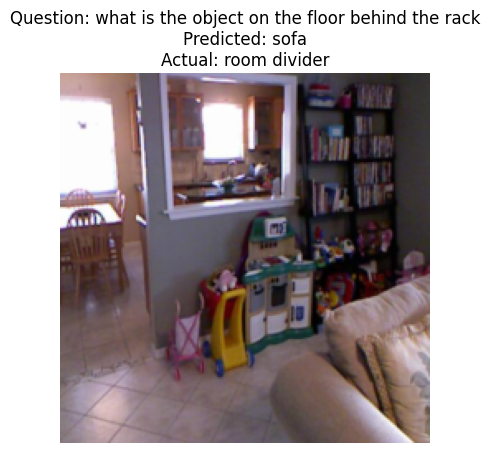

...

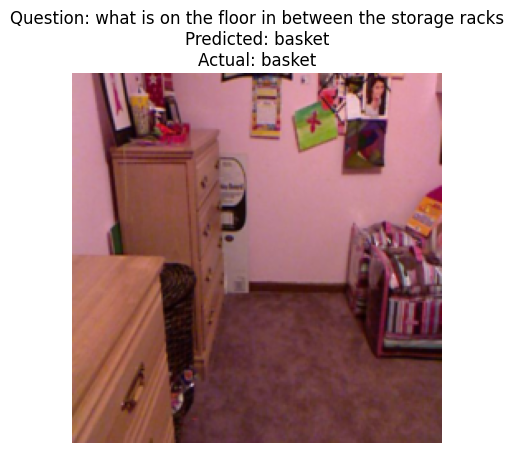

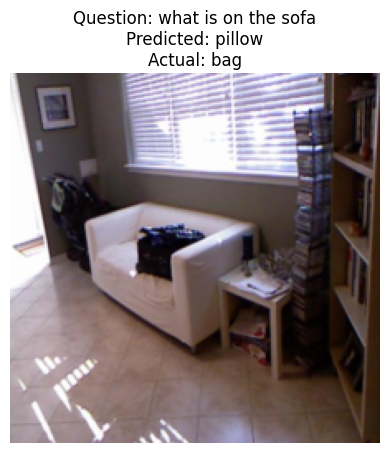

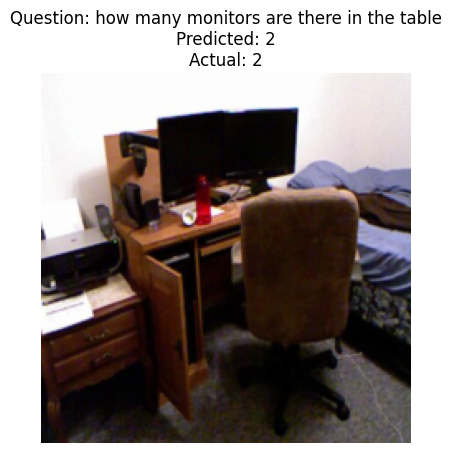

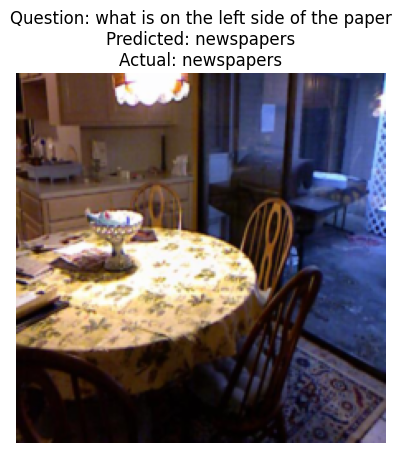

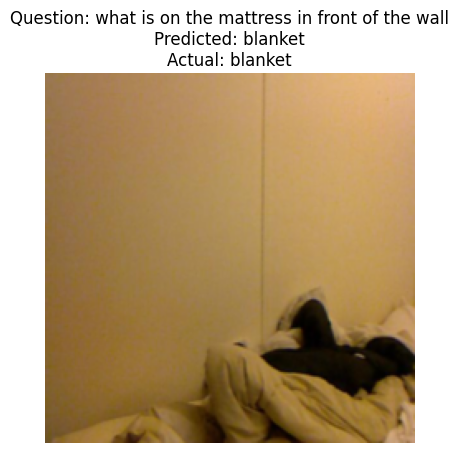

Average SBERT Similarity: 0.5727


In [34]:
with torch.no_grad():
    for idx, (images, input_ids, attention_mask, labels) in enumerate(test_loader):
        images = images.to(device)
        input_ids = input_ids.to(device)
        attention_mask = attention_mask.to(device)
        labels = labels.to(device)

        outputs = model(images, input_ids, attention_mask)
        loss = criterion(outputs, labels)

        test_losses.append(loss.item())

        _, preds = torch.max(outputs, 1)
        accuracy = calculate_accuracy(outputs, labels)
        test_accuracies.append(accuracy)

        predicted_answer = preprocess_answer(answer_space[preds.item()])
        actual_answer = preprocess_answer(answer_space[labels.item()])

        similarity = sbert_similarity(predicted_answer, actual_answer)
        similarities.append(similarity)

        # Plotting the image with question and answers
        image = images.cpu().squeeze().permute(1, 2, 0).numpy()
        image = image * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
        image = np.clip(image, 0, 1)

        plt.imshow(image)
        plt.title(f"Question: {test_dataset.data.iloc[idx]['question']}\nPredicted: {predicted_answer}\nActual: {actual_answer}")
        plt.axis('off')
        plt.show()

        if idx >= 49:  # Display only 50 samples
            break

# Print average similarity score
average_similarity = np.mean(similarities)
print(f"Average SBERT Similarity: {average_similarity:.4f}")

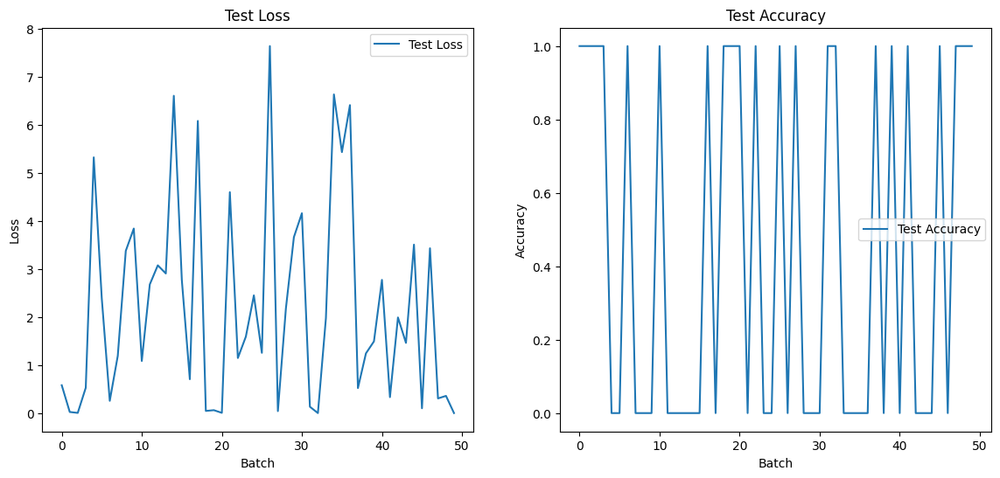

In [35]:
# Plot test accuracy and test loss
plt.figure(figsize=(14, 6))

# Test Loss
plt.subplot(1, 2, 1)
plt.plot(test_losses, label='Test Loss')
plt.xlabel('Batch')
plt.ylabel('Loss')
plt.title('Test Loss')
plt.legend()

# Test Accuracy
plt.subplot(1, 2, 2)
plt.plot(test_accuracies, label='Test Accuracy')
plt.xlabel('Batch')
plt.ylabel('Accuracy')
plt.title('Test Accuracy')
plt.legend()

plt.show()

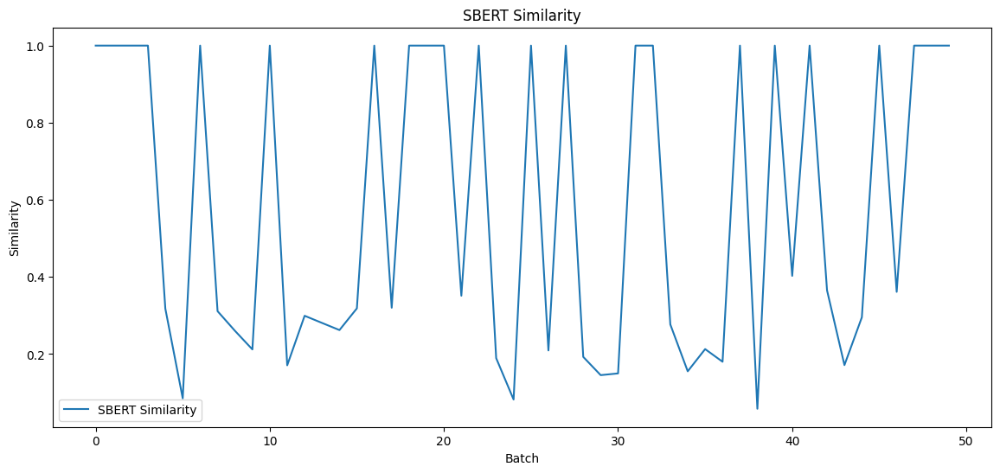

In [36]:
# Similarity
plt.figure(figsize=(14, 6))
plt.subplot(1, 1, 1)
plt.plot(similarities, label='SBERT Similarity')
plt.xlabel('Batch')
plt.ylabel('Similarity')
plt.title('SBERT Similarity')
plt.legend()
plt.show()